# Calculating Betweenness Centrality using Python

In [1]:
import networkx as nx
import osmnx as ox
import pandas as pd
import geopandas as gpd
ox.config(use_cache=True, log_console=True)

C:\Users\Admin\AppData\Local\Temp\ipykernel_3936\1101155063.py:5: UserWarning: The `utils.config` function is deprecated and will be removed in a future release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`.
  ox.config(use_cache=True, log_console=True)


Download OSM data for a specific place

In [2]:
hd_graph = ox.graph_from_place('Heidelberg, Germany', network_type='drive')

Plot the graph

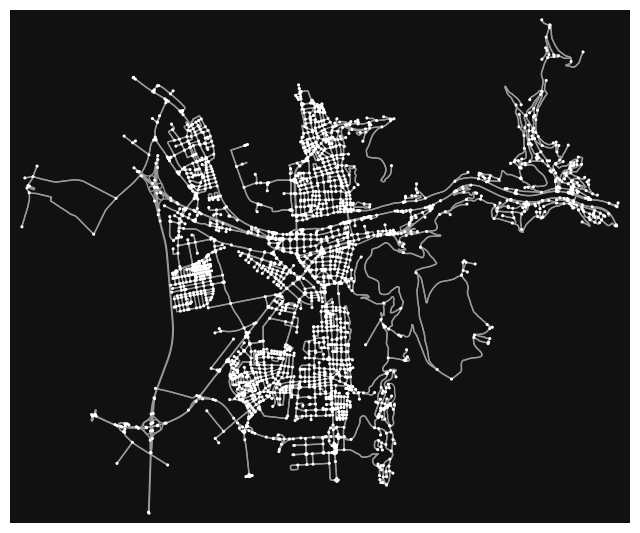

In [3]:
fig, ax = ox.plot_graph(hd_graph, node_size=5)

### Centrality

Calculate betweenness centrality using the shortest routes (i.e. `weight='length'` means that we use the length of each edge).

In [4]:
betweenness_centrality_short_hd = nx.edge_betweenness_centrality(hd_graph, weight="length")

Convert the values in `betweenness_centrality` into a `pandas.Dataframe`.

In [5]:
centrality_short_hd_df = pd.DataFrame(index=betweenness_centrality_short_hd.keys(), data=betweenness_centrality_short_hd.values())

Name the two index columns of the `centrality_df` 'u' and 'v'.

In [6]:
centrality_short_hd_df.reset_index(inplace=True)
centrality_short_hd_df.columns = ['u', 'v', 'key', 'centrality']
centrality_short_hd_df = centrality_short_hd_df.set_index(['u', 'v', 'key'])

Converting the graph to a `geopandas.GeoDataFrame` yields two dataframes. One for the nodes, and one for the edges.

In [7]:
hd_nodes_df, hd_edges_df = ox.graph_to_gdfs(hd_graph)

Join the `centrality_df` with the `edges_df`.

In [8]:
centrality_short_hd_join_df = centrality_short_hd_df.join(hd_edges_df[['osmid', 'geometry']])
centrality_short_hd_gdf = gpd.GeoDataFrame(centrality_short_hd_join_df, crs=4326)

Now that the centrality values have been joined with the edges which include the geometries, we can plot the centrality values of the road network on a map using the `geopandas.explore()` function.

In [9]:
centrality_short_hd_gdf.explore(column='centrality', cmap='magma_r', tiles='cartodbpositron')

### Betweenness centrality using the fastest routes
Calculate centrality using the fastest route instead of the shortest route.


1. Assign travel speed values to each edge using the `ox.add_edge_speeds` function. **Fill in the missing road types in the dictionary below** based on the [openrouteservice documetation on travel speeds](https://giscience.github.io/openrouteservice/documentation/travel-speeds/Waytype-Speeds.html).

In [10]:
hwy_speeds = {"motorway": 100,
              "motorway_link": 60,
              "motorroad": 90,
              "trunk": 85,
              "trunk_link": 60,
              "primary": 65,
              "primary_link": 50,
              "secondary": 60,
              "secondary_link": 50,
              "tertiary": 50,
              "tertiary_link": 40,
              "unclassified": 30,
              "residential": 30,
              "living_street": 10,
              "service": 20,
              "road": 20,
              "track": 15} 
hd_graph_with_speeds = ox.add_edge_speeds(hd_graph, hwy_speeds)

2. Calculate the travel time for each edge using the `ox.add_edge_travel_times` function.

In [11]:
hd_graph_travel_time = ox.add_edge_travel_times(hd_graph_with_speeds)

3. Calculate betweenness centrality again using the `nx.edge_betweenness_centrality` but pass `weight="travel_time` as an argument.


In [12]:
betweenness_centrality_fast_hd = nx.edge_betweenness_centrality(hd_graph_travel_time, weight="travel_time")

4. Convert the centrality value to a `pandas.DataFrame` and join it with the `edges_df` dataframe as above and visualize the result in a map.

In [13]:
centrality_fast_hd_df = pd.DataFrame(index=betweenness_centrality_fast_hd.keys(), data=betweenness_centrality_fast_hd.values())
centrality_fast_hd_df.reset_index(inplace=True)
centrality_fast_hd_df.columns = ['u', 'v', 'key', 'centrality']
centrality_fast_hd_df = centrality_fast_hd_df.set_index(['u', 'v', 'key'])
centrality_fast_hd_join_df = centrality_fast_hd_df.join(hd_edges_df[['osmid', 'geometry']])
centrality_fast_hd_gdf = gpd.GeoDataFrame(centrality_fast_hd_join_df, crs=4326)
centrality_fast_hd_gdf.explore(column='centrality', cmap='magma_r', tiles='cartodbpositron')

### Geographically adapted betweenness centrality

1. Get start and destination nodes in the graph from geographic coordinates using the `nearest_nodes` function.

In [14]:
hd_origin_node = ox.distance.nearest_nodes(hd_graph, 8.682927736779924, 49.403033763800984)

In [15]:
hd_destination_node = ox.distance.nearest_nodes(hd_graph, 8.661376326087407, 49.419627115956644) 

2. Calculate route between the two nodes using the `ox.shortest_path()` function.

In [16]:
hd_route_short = ox.shortest_path(hd_graph, hd_origin_node, hd_destination_node, weight='length')

3. Plot the route using

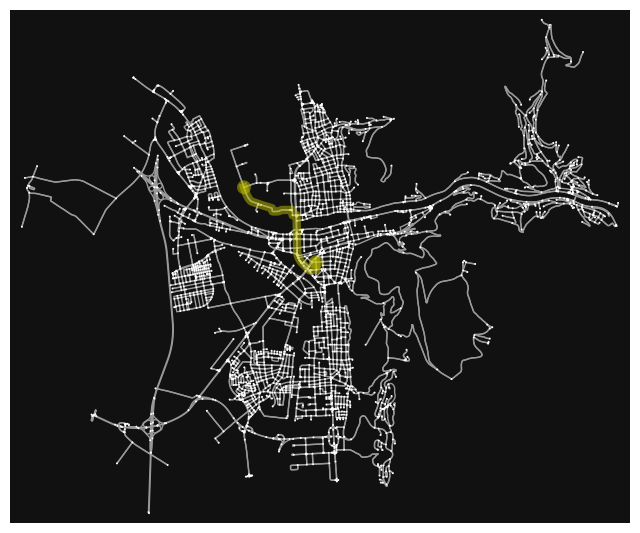

In [17]:
fig, ax = ox.plot_graph_route(hd_graph, hd_route_short, route_color="y", route_linewidth=6, node_size=2)

4. Convert the route to a `geopandas.GeoDataFrame` using the `ox.utils_graph.route_to_gdf`.

In [18]:
hd_route_short_gdf = ox.utils_graph.route_to_gdf(hd_graph, hd_route_short, weight='length')

5. Generate 100 routes by choosing random start and endpoints.

#### First approach: Using a polygon from the study area

In [19]:
study_area = 'Heidelberg, Germany'
study_area_hd = ox.geocode_to_gdf(study_area)
study_area_hd.explore()

Random distribution of points within the polygon and calculation of the route between them

In [20]:
from shapely.geometry import Point
import random
import numpy as np

def random_points_in_polygon(polygon, number):   
    poly = polygon.geometry.values[0]
    minx, miny, maxx, maxy = poly.bounds
    x = np.random.uniform(minx, maxx, number)
    y = np.random.uniform(miny, maxy, number)
    points = [Point(xy) for xy in zip(x, y)]
    gdf_points = gpd.GeoDataFrame(geometry=points, crs="EPSG:4326")
    spatial_join = gpd.tools.sjoin(gdf_points, polygon, predicate="within", how='left')
    pts_in_poly = gdf_points[spatial_join.index_right==0.0] 
    while len(pts_in_poly) < number:
        additional_points = number - len(pts_in_poly)
        x_loop = np.random.uniform(minx, maxx, size=additional_points)
        y_loop = np.random.uniform(miny, maxy, size=additional_points)
        add_points = [Point(xy) for xy in zip(x_loop, y_loop)]
        additional_gdf = gpd.GeoDataFrame(geometry=add_points, crs="EPSG:4326")
        spatial_join_loop = gpd.tools.sjoin(additional_gdf, polygon, predicate="within", how="left")
        pts_loop = additional_gdf[spatial_join_loop.index_right == 0.0]
        pts_in_poly = pd.concat([pts_in_poly, pts_loop], ignore_index=True)
    pts_in_poly["x"] = pts_in_poly["geometry"].x
    pts_in_poly["y"] = pts_in_poly["geometry"].y
    return pts_in_poly

In [21]:
all_sample_routes = []
count = 0
while count < 100:
    sample_points_hd = random_points_in_polygon(study_area_hd, 2)
    nodes = [ox.nearest_nodes(hd_graph, x, y) for x, y in zip(sample_points_hd["x"], sample_points_hd["y"])]
    origin_node, destination_node = nodes
    random_route = ox.shortest_path(hd_graph, origin_node, destination_node, weight="length")
    while origin_node == destination_node or random_route is None:
        sample_points_hd = random_points_in_polygon(study_area_hd, 2)
        nodes = [ox.nearest_nodes(hd_graph, x, y) for x, y in zip(sample_points_hd["x"], sample_points_hd["y"])]
        origin_node, destination_node = nodes
        random_route = ox.shortest_path(hd_graph, origin_node, destination_node, weight="length")
    one_route_gdf = ox.utils_graph.route_to_gdf(hd_graph, random_route, weight="length")
    all_sample_routes.append(one_route_gdf)
    count += 1
routes_hd_gdf = pd.concat(all_sample_routes)#merge all route dataframes using the `pd.concat` function  

In [22]:
routes_hd_gdf.explore()

6. Calculate betweenness centrality indicator of the graph by grouping the routes by the columns 'u', 'v' and 'key' and counting the number of features. Join the dataframe containing the manually computed centrality values with the `edges_df` dataframe. Plot the manually computed betweenness centrality on an interactive map.

In [23]:
centrality_geo_hd = pd.DataFrame(routes_hd_gdf["osmid"].groupby(['u', 'v', 'key']).count())
centrality_geo_hd.columns = ['centrality']
centrality_geo_hd_join_df = centrality_geo_hd.join(hd_edges_df[['osmid', 'geometry']])
centrality_geo_hd_join_gdf = gpd.GeoDataFrame(centrality_geo_hd_join_df, crs=4326)

In [24]:
centrality_geo_hd_join_gdf.explore(column='centrality', cmap='magma_r', tiles='cartodbpositron')

#### Second approach: Using the geographic coordinates

In [25]:
count = 0
list_of_gdfs = []
while count < 100:
    a = random.uniform(8.661376326087407,  8.682927736779924)
    b = random.uniform(49.403033763800984,  49.419627115956644)
    c = random.uniform(8.661376326087407,  8.682927736779924)
    d = random.uniform(49.403033763800984,  49.419627115956644)
    origin_node = ox.distance.nearest_nodes(hd_graph, a, b)
    destination_node = ox.distance.nearest_nodes(hd_graph, c, d) 
    route_to_dest = ox.shortest_path(hd_graph, origin_node, destination_node, weight='length')
    if len(route_to_dest) > 1:
        gdf_count = ox.utils_graph.route_to_gdf(hd_graph, route_to_dest, weight='length')
        list_of_gdfs.append(gdf_count) 
        count += 1
df_geographically = pd.concat(list_of_gdfs)

In [26]:
centrality_df_new = pd.DataFrame(df_geographically["osmid"].groupby(['u', 'v', 'key']).count())
centrality_df_new.columns = ['centrality']
centrality_new_join_edge_df = centrality_df_new.join(hd_edges_df[['osmid', 'geometry']])
centrality_new_gdf = gpd.GeoDataFrame(centrality_new_join_edge_df, crs=4326)

In [27]:
centrality_new_gdf.explore(column='centrality', cmap='magma_r', tiles='cartodbpositron')

 ### Bonus

Write a function which chooses a start and destination node from the graph based on the population distribution from the [Global Human Settlement population layer](https://ghsl.jrc.ec.europa.eu/download.php?ds=pop).



In [28]:
import rasterio 
import rasterio.mask 
import sys

#### Clip raster to study area

In [29]:
def clip_raster(study_area, raster_path):
    poly = ox.geocode_to_gdf(study_area) 
    shapes = list(poly.geometry)
    with rasterio.open(raster_path) as src:
        if poly.crs==src.crs:
            print("CRS match and clip can be performed")
        else:
            raise ValueError("CRS of the grid does not match the CRS of the polygon. Please adjust this")
            sys.exit(1)
        out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
        out_meta = src.meta
    out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})
    with rasterio.open("data/Pop_masked_polygon.tif", "w", **out_meta) as dest:
        dest.write(out_image)
    
rast_path='data/GHS_POP_100m_2020.tif' #Projection EPSG 4326, in QGIS merged and reprojected
area='Heidelberg, Germany'
clip_raster(area, rast_path)

CRS match and clip can be performed


#### Create random points in polygon

In [30]:
def random_points_in_polygon(polygon, number):   
    poly = polygon.geometry.values[0]
    minx, miny, maxx, maxy = poly.bounds
    x = np.random.uniform(minx, maxx, number)
    y = np.random.uniform(miny, maxy, number)
    points = [Point(xy) for xy in zip(x, y)]
    gdf_points = gpd.GeoDataFrame(geometry=points, crs="EPSG:4326")
    spatial_join = gpd.tools.sjoin(gdf_points, polygon, predicate="within", how='left')
    pts_in_poly = gdf_points[spatial_join.index_right==0.0] 
    while len(pts_in_poly) < number:
        additional_points = number - len(pts_in_poly)
        x_loop = np.random.uniform(minx, maxx, size=additional_points)
        y_loop = np.random.uniform(miny, maxy, size=additional_points)
        add_points = [Point(xy) for xy in zip(x_loop, y_loop)]
        additional_gdf = gpd.GeoDataFrame(geometry=add_points, crs="EPSG:4326")
        spatial_join_loop = gpd.tools.sjoin(additional_gdf, polygon, predicate="within", how="left")
        pts_loop = additional_gdf[spatial_join_loop.index_right == 0.0]
        pts_in_poly = pd.concat([pts_in_poly, pts_loop], ignore_index=True)
    pts_in_poly["x"] = pts_in_poly["geometry"].x
    pts_in_poly["y"] = pts_in_poly["geometry"].y
    return pts_in_poly

poly = ox.geocode_to_gdf('Heidelberg, Germany') #EPSG 4326
pts_hd = random_points_in_polygon(poly, 20)

#### Show points in polygon

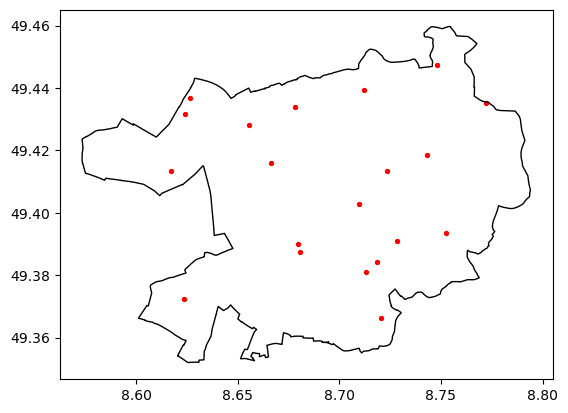

In [31]:
import matplotlib.pyplot as plt
base=poly.boundary.plot(linewidth=1, edgecolor="black")
pts_hd.plot(ax=base, linewidth=1, color="red", markersize=8)
plt.show()

#### Linking the points to its raster values

In [32]:
def n_points_with_highest_raster_values(raster_path, points_gdf, n):
    with rasterio.open(raster_path) as src:
        raster_values = src.read(1)
        values_at_points = []
        for point in points_gdf.geometry:
            x, y = point.x, point.y
            row, col = src.index(x, y)
            value = raster_values[row, col]
            values_at_points.append(value)
        points_gdf['raster_value'] = values_at_points
        sorted_points = points_gdf.sort_values(by='raster_value', ascending=False)
        top_points = sorted_points.iloc[:n]
        while len(top_points.geometry.unique()) != n:#avoids the problem that 2 random points with the highest population have the same geometry
            top_points = sorted_points.iloc[n:(n*2)]
        return top_points
      
pop_path = "data/Pop_masked_polygon.tif"
relevant_points=n_points_with_highest_raster_values(pop_path, pts_hd,2)

#### Calculation and Plotting of shortest route 

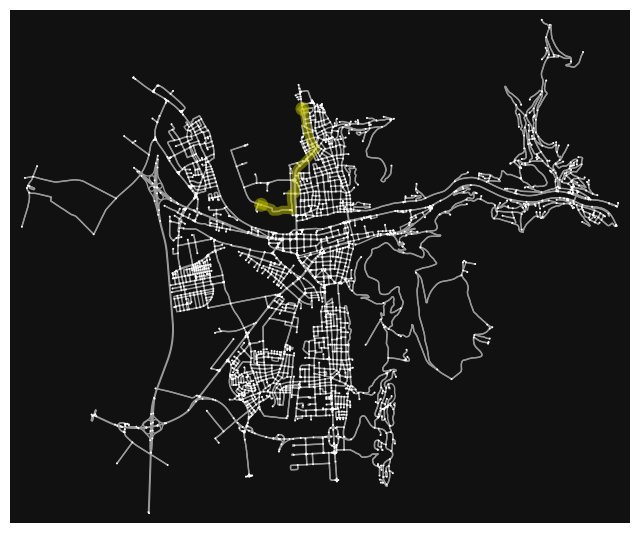

In [33]:
def get_route(rel_points):
    origin_node=ox.nearest_nodes(hd_graph, rel_points.iloc[0]['x'],  rel_points.iloc[0]['y'])
    destination_node=ox.nearest_nodes(hd_graph, rel_points.iloc[1]['x'],  rel_points.iloc[1]['y'])
    route = ox.shortest_path(hd_graph, origin_node, destination_node, weight="length")
    fig, ax = ox.plot_graph_route(hd_graph, route, route_color="y", route_linewidth=6, node_size=2)

get_route(relevant_points)

Function to calculate betweenness based on population data

In [43]:
def get_geographical_centrality_population_based(number_of_routes):   
    all_sample_routes = []
    count = 0
    while count < number_of_routes: 
        pts = random_points_in_polygon(poly, 100) #Value can be adjusted depending on the region, but should not be too small
        rel_points = n_points_with_highest_raster_values(pop_path, pts,2)
        nodes = [ox.nearest_nodes(hd_graph, x, y) for x, y in zip(rel_points["x"], rel_points["y"])]
        origin_node, destination_node = nodes
        random_route = ox.shortest_path(hd_graph, origin_node, destination_node, weight="length")
        while origin_node == destination_node or random_route is None:
            pts = random_points_in_polygon(poly, 100)
            rel_points = n_points_with_highest_raster_values(pop_path, pts,2)
            nodes = [ox.nearest_nodes(hd_graph, x, y) for x, y in zip(rel_points["x"], rel_points["y"])]
            origin_node, destination_node = nodes
            random_route = ox.shortest_path(hd_graph, origin_node, destination_node, weight="length")
        gdf_route = ox.utils_graph.route_to_gdf(hd_graph, random_route, weight='length')
        all_sample_routes.append(gdf_route)  
        count += 1
    geographically_pop_df = pd.concat(all_sample_routes)
    centrality_pop_df = pd.DataFrame(geographically_pop_df["osmid"].groupby(['u', 'v', 'key']).count())
    centrality_pop_df.columns = ['centrality']
    centrality_pop_df_join = centrality_pop_df.join(hd_edges_df[['osmid', 'geometry']])
    centrality_pop_gdf = gpd.GeoDataFrame(centrality_pop_df_join, crs=4326)
    return centrality_pop_gdf

centrality_pop_hd_gdf = get_geographical_centrality_population_based(50)

In [42]:
centrality_pop_hd_gdf.explore(column='centrality', cmap='magma_r', tiles='cartodbpositron')